In [38]:
# PyTorch Library
import torch
import torch_geometric
from torch.nn import Linear
from torch_geometric.nn import GCNConv
from torch_geometric.loader import DataLoader


# Visualization Tools
import networkx as nx
import matplotlib.pyplot as plt

# Numpy Library
import numpy as np

# Auxilary Libraries
import itertools
from sklearn.preprocessing import StandardScaler

# Data Preparation

In [39]:
device = torch.device('cuda')
dtype = torch.float
pi = torch.pi

In [40]:
# Ground Truth Data 
Pressure_Target = np.genfromtxt(r'C:\Users\YUSIFOH\NNs\GNN\data\Pressure_Target.dat')
Saturation_Target = np.genfromtxt(r'C:\Users\YUSIFOH\NNs\GNN\data\Saturation_Target.dat')

Y_target = np.zeros((len(Pressure_Target), len(Pressure_Target[0]), 2))
for i in range(len(Pressure_Target)):
    Y_target[i] = np.stack([Pressure_Target[i], Saturation_Target[i]], axis=1)
    
Y_target = torch.tensor(Y_target, dtype = dtype).to(device=device)

In [41]:
# Known Data
Days = 400
t = torch.linspace(0, Days, Days+1)
dt = torch.ones(Days) 
# Reservoir Properties
dx = torch.tensor(30.0).to(device = device) # ft
dy = torch.tensor(30.0).to(device = device) # ft
dz = torch.tensor(30.0).to(device = device) # ft
Vij = dx*dy*dz # Cell Volume (Uniformly) [ft^3]
Nx = 15 # Number of Cells In direction of 'x' axis
Ny = 15 # Number of Cells In direction of 'y' axis
Nz = 1  # Number of Cells In direction of 'z' axis
Res_Length = dx*Nx # ft
Res_Width = dy*Ny  # ft
K = np.genfromtxt(r'C:\Users\YUSIFOH\NNs\2D_2PHASE_FLOW_JAC\permx.dat', dtype=None, delimiter=',')
K = torch.tensor(K, dtype = dtype).to(device = device) # Permeability [mD]
K_rshpd = K.view(Nx, Ny)

In [42]:
def min_max_scaler(data, min, max, inverse = False):
    if inverse == False:
        return (data - min)/(max - min)
    elif inverse == True:
        return data*(max - min) + min

def log_scaler(data, inverse = False):
    if inverse == False:
        return (torch.log(data)-torch.log(data).min())/(torch.log(data).max()-torch.log(data).min())
    elif inverse == True:
        return torch.exp(data*((torch.log(data).max()-torch.log(data).min())) + torch.log(data).min())

In [43]:
# Cell IDs and Their Locatins
cell_IDs = torch.linspace(0, 224, 225, dtype=torch.int) # No
x_loc =  torch.linspace(0*dx + dx/2,  Nx*dx - dx/2, 15) # ft
y_loc = torch.linspace(0*dy + dy/2,  Ny*dy - dy/2, 15)  # ft
cell_loc = torch.tensor(list(itertools.product(x_loc, y_loc)), dtype= dtype)# (ft, ft)

cell_loc_scaled = min_max_scaler(cell_loc, cell_loc.min(), cell_loc.max(), inverse = False).to(device=device)
t_scaled = min_max_scaler(t, t.min(), t.max(), inverse = False).to(device=device)
K_scaled = log_scaler(K, inverse = False).to(device=device)
Pressure_Target_scaled = min_max_scaler(Pressure_Target, 0, 8000, inverse = False)

Y_target_scaled = np.zeros((len(Pressure_Target), len(Pressure_Target[0]), 2))
for i in range(len(Pressure_Target)):
    Y_target_scaled[i] = np.stack([Pressure_Target_scaled[i], Saturation_Target[i]], axis=1)
    
Y_target_scaled = torch.tensor(Y_target_scaled, dtype = dtype).to(device=device)

In [44]:
# Feature Matrices
X_scaled = []
for i in t[1:]:
    x = torch.stack((cell_loc_scaled[:, 0], cell_loc_scaled[:, 1], K_scaled, torch.ones(K_scaled.shape[0]).to(device=device)*t_scaled[int(i)]), axis = 1)
    X_scaled.append(x)
len(X_scaled)

400

In [45]:
# Edge Indexes (Connection Between Cells)
edge_index = []
pos_dict = {}
cell_IDs_rshpd = cell_IDs.view(Nx, Ny)
for i in range(Nx):
    for j in range(Ny):
        pos_dict[cell_IDs_rshpd[i, j].item()] = (j, i)
        if i == 0 and j == 0:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j+1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i+1, j]])
        elif i == 0 and j == 14:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j-1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i+1, j]])
        elif i == 14 and j == 0:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i-1, j]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j+1]])
        elif i == 14 and j == 14:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i-1, j]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j-1]])
        elif j > 0 and j < 14 and i == 0:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j-1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j+1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i+1, j]])
        elif j > 0 and j < 14 and i == 14:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i-1, j]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j-1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j+1]])
        elif i > 0 and i < 14 and j == 0:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i-1, j]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j+1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i+1, j]])
        elif i > 0 and i < 14 and j == 14:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i-1, j]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j-1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i+1, j]])
        else:
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i-1, j]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j-1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i, j+1]])
            edge_index.append([cell_IDs_rshpd[i, j], cell_IDs_rshpd[i+1, j]])
            
cell_Locations = np.array(list(pos_dict.values()))
cell_LocationsX = cell_Locations[:, 0]
cell_LocationsY = cell_Locations[:, 1]
edge_index = np.array(edge_index)
edge_index = torch.tensor(edge_index).to(device=device)

In [46]:
Data_list = [] # Graph Data Holder
# Converting data to Graph  
for i in range(len(t[1:])):
    Data_list.append(torch_geometric.data.Data(x=X_scaled[i], edge_index=edge_index.T, y=Y_target_scaled[i]))

Graph Example

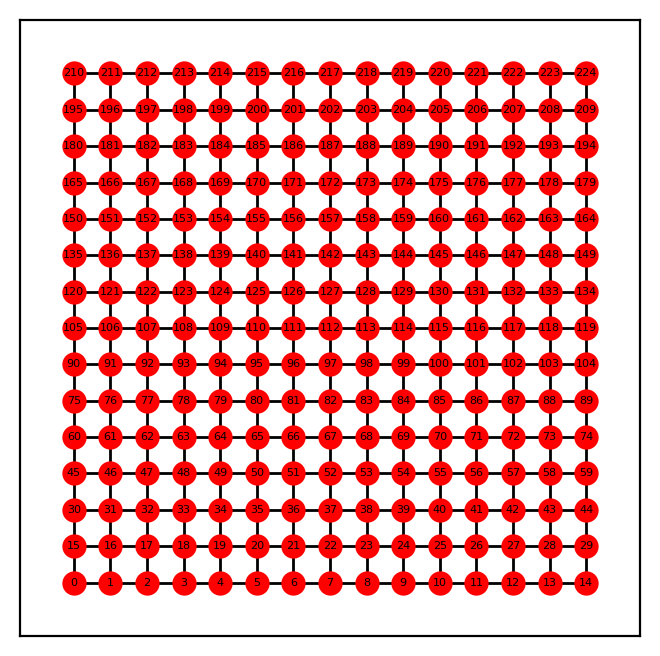

In [47]:
g = torch_geometric.utils.to_networkx(Data_list[4], to_undirected=True)
# Getting Adjacency Matrix:
adj_matrix_sparse = nx.adjacency_matrix(g)
#adj_matrix_dense = torch.tensor(adj_matrix_sparse.todense())
# Graph Visualization
plt.figure(figsize=(4, 4), dpi= 200)
nx.draw_networkx(g, with_labels= True, pos = pos_dict ,node_size = 60, node_color = 'red', font_size = 4)
plt.show()

# Data Split

In [48]:
import random
def split(data_list, train_size, rd = False):
    test_list = []
    train_list = []
    selected_idx = []
    selected_idx_test = []
    num0ftrain = int(round(len(data_list)*train_size, 0))
    if rd:
        for i in range(num0ftrain):
            while True:
                get_index = random.randrange(len(data_list))
                if not get_index in selected_idx:
                    selected_idx.append(get_index)
                    train_list.append(data_list[get_index])
                    break
        for i in range(int(len(data_list))):
            if not i in selected_idx:
                selected_idx_test.append(i)
                test_list.append(data_list[i])
        
        return train_list, test_list,selected_idx, selected_idx_test
    else:
        for i in range(num0ftrain):
            selected_idx.append(i)
            train_list.append(data_list[i])

        for i in range(int(len(data_list))):
            if not i in selected_idx:
                selected_idx_test.append(i)
                test_list.append(data_list[i])
        
        return train_list, test_list,selected_idx, selected_idx_test

random.seed(123)
train_list, test_list, train_idx, test_idx = split(Data_list, 0.7, rd=True)

In [77]:
train_loader = DataLoader(train_list, batch_size=len(train_list), shuffle=False)
test_loader = DataLoader(test_list, batch_size=len(test_list), shuffle=False)
data_loader = DataLoader(Data_list, batch_size=len(Data_list), shuffle=False) 

# Model Building

In [50]:
loss_list_P = []
loss_list_S = []
import torch
from torch.nn import Linear, Tanh
from torch_geometric.nn import Sequential, GATConv
torch.manual_seed(123)
class ENC_DEC_P(torch.nn.Module):
    def __init__(self,in_features, embedding_dim, hidden_channels, n_nodes):
        super().__init__()
        self.n_nodes = n_nodes
        # encoding
        self.enc_block1 = Sequential('x, edge_index', [(GATConv(in_channels = in_features         , out_channels = hidden_channels[0], heads= 2), 'x, edge_index -> x'),  Tanh()])
        self.enc_block2 = Sequential('x, edge_index', [(GATConv(in_channels = hidden_channels[0]*2, out_channels = hidden_channels[1], heads= 2), 'x, edge_index -> x'),  Tanh()])
        self.enc_block3 = Sequential('x, edge_index', [(GATConv(in_channels = hidden_channels[1]*2, out_channels = hidden_channels[2], heads= 2), 'x, edge_index -> x'),  Tanh()])
        self.enc_block4 = Sequential('x, edge_index', [(GATConv(in_channels = hidden_channels[2]*2, out_channels = embedding_dim,      heads= 1), 'x, edge_index -> x'),  Tanh()])

        # processing
        self.prc_block1 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])
        self.prc_block2 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])
        self.prc_block3 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])

        # decoding
        self.dec_block1 = Sequential('x, edge_index', [(GATConv(in_channels = embedding_dim, out_channels = embedding_dim, heads= 1),             'x, edge_index -> x'),       Tanh()])
        self.dec_block2 = Sequential('x, edge_index', [(GATConv(in_channels = embedding_dim, out_channels = embedding_dim, heads= 1),             'x, edge_index -> x'),       Tanh()])

        # linearize
        self.lin_block1 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])
    
    def forward(self,h0, edge_index):
        # encode
        h1 = self.enc_block1(h0, edge_index)
        h2 = self.enc_block2(h1, edge_index)
        h3 = self.enc_block3(h2, edge_index)
        h4 = self.enc_block4(h3, edge_index)
        # process
        h_prc1 = self.prc_block1(h4.view(-1, self.n_nodes))
        h_prc2 = self.prc_block2(h_prc1)
        h_prc3 = self.prc_block3(h_prc2)
        # decode
        h4_ = self.dec_block1(h_prc3.view(-1, 1), edge_index)
        h3_ = self.dec_block2(h4_, edge_index)
        # linearize
        h = self.lin_block1(h3_.view(-1, self.n_nodes))
        return h

class ENC_DEC_S(torch.nn.Module):
    def __init__(self,in_features, embedding_dim, hidden_channels, n_nodes):
        super().__init__()
        self.n_nodes = n_nodes
        # encoding
        self.enc_block1 = Sequential('x, edge_index', [(GATConv(in_channels = in_features         , out_channels = hidden_channels[0], heads= 2), 'x, edge_index -> x'),  Tanh()])
        self.enc_block2 = Sequential('x, edge_index', [(GATConv(in_channels = hidden_channels[0]*2, out_channels = hidden_channels[1], heads= 2), 'x, edge_index -> x'),  Tanh()])
        self.enc_block3 = Sequential('x, edge_index', [(GATConv(in_channels = hidden_channels[1]*2, out_channels = hidden_channels[2], heads= 2), 'x, edge_index -> x'),  Tanh()])
        self.enc_block4 = Sequential('x, edge_index', [(GATConv(in_channels = hidden_channels[2]*2, out_channels = embedding_dim,      heads= 1), 'x, edge_index -> x'),  Tanh()])

        # processing
        self.prc_block1 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])
        self.prc_block2 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])
        self.prc_block3 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])

        # decoding
        self.dec_block1 = Sequential('x, edge_index', [(GATConv(in_channels = embedding_dim, out_channels = embedding_dim, heads= 1),             'x, edge_index -> x'),       Tanh()])
        self.dec_block2 = Sequential('x, edge_index', [(GATConv(in_channels = embedding_dim, out_channels = embedding_dim, heads= 1),             'x, edge_index -> x'),       Tanh()])

        # linearize
        self.lin_block1 = Sequential('x', [(Linear(in_features = n_nodes , out_features= n_nodes, bias=True), 'x -> x'), Tanh()])
    
    def forward(self,h0, edge_index):
        # encode
        h1 = self.enc_block1(h0, edge_index)
        h2 = self.enc_block2(h1, edge_index)
        h3 = self.enc_block3(h2, edge_index)
        h4 = self.enc_block4(h3, edge_index)
        # process
        h_prc1 = self.prc_block1(h4.view(-1, self.n_nodes))
        h_prc2 = self.prc_block2(h_prc1)
        h_prc3 = self.prc_block3(h_prc2)
        # decode
        h4_ = self.dec_block1(h_prc3.view(-1, 1), edge_index)
        h3_ = self.dec_block2(h4_, edge_index)
        # linearize
        h = self.lin_block1(h3_.view(-1, self.n_nodes))
        return h

class PI_GCN(torch.nn.Module):
    def __init__(self, in_features, embedding_dim, hidden_channels, n_nodes):
        super().__init__()
        # Deploying Pressure and Saturation Model
        self.P_model = ENC_DEC_P(in_features, embedding_dim, hidden_channels, n_nodes)
        self.S_model = ENC_DEC_S(in_features, embedding_dim, hidden_channels, n_nodes)
        self.loss_fn = torch.nn.MSELoss()
        
    def P_S_prediction(self, h0, edge_index):
        P_prediction = self.P_model.forward(h0, edge_index).view(-1, 1)
        S_prediction = self.S_model.forward(h0, edge_index).view(-1, 1)
        return [P_prediction, S_prediction]
    
    def Loss(self, P_pred, S_pred, Pressure_Target, Saturation_Target):
        loss_P = self.loss_fn(P_pred, Pressure_Target)
        loss_S = self.loss_fn(S_pred, Saturation_Target)
        #loss_list_P.append(loss_P)
        #loss_list_S.append(loss_S)
        print("Loss P = {}     Loss S = {}".format(loss_P, loss_S))
        return loss_P + loss_S

# Optimizer

In [51]:
def training_w_LBFGS(model, train_data, test_data, lr, max_iter, history_size, tolerance_grad, tolerance_change, line_search_fn, n, save_model = False):
    training_loss_list = []
    test_loss_list = []
    # Setting Optimizer
    optimizer = torch.optim.LBFGS(model.parameters(),lr=lr, max_iter=max_iter, history_size = history_size, tolerance_grad=tolerance_grad, tolerance_change = tolerance_change, line_search_fn = line_search_fn)
    # Training Loop
    for batch_train in train_data:
        for batch_test in test_data:
            def closure():
                # initialize optimizer
                optimizer.zero_grad()
                
                # forward pass
                h0, edge_index, y_train = batch_train.x, batch_train.edge_index,  batch_train.y
                train_prediction = model.P_S_prediction(h0, edge_index)
                train_P_pred, train_S_pred = train_prediction[0], train_prediction[1]
                train_loss = model.Loss(train_P_pred, train_S_pred, y_train[:, [0]], y_train[:, [1]])

                h0, edge_index, y_test = batch_test.x, batch_test.edge_index, batch_test.y
                test_prediction = model.P_S_prediction(h0, edge_index)
                test_P_pred, test_S_pred = test_prediction[0], test_prediction[1]
                test_loss = model.Loss(test_P_pred, test_S_pred, y_test[:, [0]], y_test[:, [1]])

                # collecting loss
                print("#Epoch = {}".format(len(training_loss_list))," | Train Loss = {}".format(train_loss.item()), " | Test Loss = {}".format(test_loss.item()))
                training_loss_list.append(train_loss.item()) 
                test_loss_list.append(test_loss.item()) 

                # backward pass
                train_loss.backward()
                return train_loss
            optimizer.step(closure)
    if save_model == True:
        torch.save(model.state_dict(), r"C:\Users\YUSIFOH\ERPE 394A\Huseyn_Yusifov_Homework_4\lbfgs saved nn models\lbfgs_model_{}.pth".format(n))
    return training_loss_list, test_loss_list

# Training

In [55]:
in_features, embedding_dim, hidden_channels, n_nodes = 4, 1, [24, 12, 6], 225
model = PI_GCN(in_features, embedding_dim, hidden_channels, n_nodes).to(device=device)
model

PI_GCN(
  (P_model): ENC_DEC_P(
    (enc_block1): Sequential(
      (0) - GATConv(4, 24, heads=2): x, edge_index -> x
      (1) - Tanh(): x -> x
    )
    (enc_block2): Sequential(
      (0) - GATConv(48, 12, heads=2): x, edge_index -> x
      (1) - Tanh(): x -> x
    )
    (enc_block3): Sequential(
      (0) - GATConv(24, 6, heads=2): x, edge_index -> x
      (1) - Tanh(): x -> x
    )
    (enc_block4): Sequential(
      (0) - GATConv(12, 1, heads=1): x, edge_index -> x
      (1) - Tanh(): x -> x
    )
    (prc_block1): Sequential(
      (0) - Linear(in_features=225, out_features=225, bias=True): x -> x
      (1) - Tanh(): x -> x
    )
    (prc_block2): Sequential(
      (0) - Linear(in_features=225, out_features=225, bias=True): x -> x
      (1) - Tanh(): x -> x
    )
    (prc_block3): Sequential(
      (0) - Linear(in_features=225, out_features=225, bias=True): x -> x
      (1) - Tanh(): x -> x
    )
    (dec_block1): Sequential(
      (0) - GATConv(1, 1, heads=1): x, edge_index -> 

Choose: Train or Use Pretrained Model

In [73]:
loaded_model = True
if loaded_model == True:
    model.load_state_dict(torch.load(r"C:\Users\YUSIFOH\NNs\GNN\DATA DRIVEN\save models\GAT.pth"))
else:
    lr = 1.0
    N_epochs = 1
    max_iter = 4000
    history_size = 300
    line_search_fn = 'strong_wolfe'
    tolerance_grad = 1e-07
    tolerance_change = 1e-09
    n = 0
    train_loss, test_loss = training_w_LBFGS(model, train_loader, test_loader, lr, max_iter, history_size, tolerance_grad, tolerance_change, line_search_fn, n, save_model = False)
    #torch.save(model.state_dict(), r"C:\Users\YUSIFOH\NNs\GNN\DATA DRIVEN\save models\GAT_new.pth")

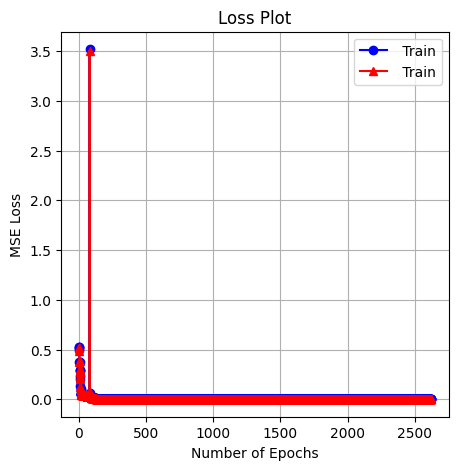

In [61]:
plt.figure(figsize=(5,5), dpi=100)
plt.plot(train_loss, "-ob", label = " Train")
plt.plot(test_loss, "-^r", label = " Train")
plt.grid()
plt.legend()
plt.title("Loss Plot")
plt.ylabel("MSE Loss")
plt.xlabel("Number of Epochs")
#plt.savefig(r"C:\Users\YUSIFOH\NNs\GNN\DATA DRIVEN\loss_sens_GAT.png")
plt.show()

# Evaluation

In [78]:
batch_test = next(iter(test_loader))
h0, edge_index, y_test = batch_test.x, batch_test.edge_index, batch_test.y
test_prediction = model.P_S_prediction(h0, edge_index)
P_pred_scaled = test_prediction[0].view(-1, 225)
S_pred = test_prediction[1].view(-1, 225)
P_true_scaled = y_test[:, 0].view(-1, 225)
S_true = y_test[:, 1].view(-1, 225)

batch_train = next(iter(train_loader))
h0, edge_index, y_train = batch_train.x, batch_train.edge_index, batch_train.y
train_prediction = model.P_S_prediction(h0, edge_index)
P_pred_scaled_train = train_prediction[0].view(-1, 225)
S_pred_train = train_prediction[1].view(-1, 225)
P_true_scaled_train = y_train[:, 0].view(-1, 225)
S_true_train = y_train[:, 1].view(-1, 225)

batch_data = next(iter(data_loader))
h0, edge_index, y_data = batch_data.x, batch_data.edge_index, batch_data.y
data_prediction = model.P_S_prediction(h0, edge_index)
P_pred_scaled_data = data_prediction[0].view(-1, 225)
S_pred_data        = data_prediction[1].view(-1, 225)
P_true_scaled_data = y_data[:, 0].view(-1, 225)
S_true_data        = y_data[:, 1].view(-1, 225)

In [79]:
P_true = min_max_scaler(P_true_scaled, min  = 0, max = 8000, inverse=True)
P_pred = min_max_scaler(P_pred_scaled, min  = 0, max = 8000, inverse=True)
P_true_train = min_max_scaler(P_true_scaled_train, min  = 0, max = 8000, inverse=True)
P_pred_train = min_max_scaler(P_pred_scaled_train, min  = 0, max = 8000, inverse=True)
P_true_data = min_max_scaler(P_true_scaled_data, min  = 0, max = 8000, inverse=True)
P_pred_data = min_max_scaler(P_pred_scaled_data, min  = 0, max = 8000, inverse=True)

In [84]:
#np.savetxt(r"C:\Users\YUSIFOH\NNs\GNN\DATA Generation copy\P_pred_data_gat.mat", P_pred_data.cpu().detach().numpy())
#np.savetxt(r"C:\Users\YUSIFOH\NNs\GNN\DATA Generation copy\S_pred_data_gat.mat", S_pred_data.cpu().detach().numpy())

In [80]:
def R2(test_true, test_pred):
    from sklearn.metrics import r2_score
    """R2 plot calculation"""
    # Get prediciton score in terms of R2
    r2_test  = r2_score(test_true ,  test_pred)
    return r2_test

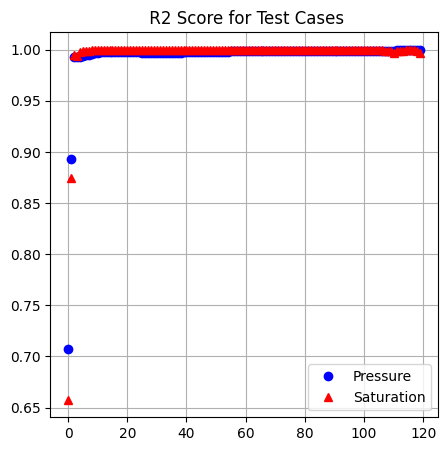

(0.9947786870639442,
 0.7070380076250823,
 0.9998868421358017,
 0.9956994776705914,
 0.657584135300376,
 0.9999767574727132)

In [86]:
p_r2_list = []
s_r2_list = []
for i in range(len(test_list)):
    r2 = R2(P_true[i].cpu().detach().numpy(), P_pred[i].cpu().detach().numpy())
    p_r2_list.append(r2)
    r2 = R2(S_true[i].cpu().detach().numpy(), S_pred[i].cpu().detach().numpy())
    s_r2_list.append(r2)

p_r2_list = np.array(p_r2_list)
s_r2_list = np.array(s_r2_list)

plt.figure(figsize=(5, 5), dpi = 100)
plt.plot(p_r2_list, "ob", label = "Pressure")
plt.plot(s_r2_list, "^r", label = "Saturation")
plt.title(" R2 Score for Test Cases")
plt.legend()
plt.grid()
#plt.savefig(r"C:\Users\YUSIFOH\NNs\GNN\DATA DRIVEN\r2_GAT.png")
plt.show()
np.mean(p_r2_list), np.min(p_r2_list),np.max(p_r2_list),  np.mean(s_r2_list), np.min(s_r2_list), np.max(s_r2_list)

In [76]:
#np.savetxt(r"C:\Users\YUSIFOH\NNs\GNN\comparison data\r2_p_gat.mat", p_r2_list)
#np.savetxt(r"C:\Users\YUSIFOH\NNs\GNN\comparison data\r2_s_gat.mat", s_r2_list)

In [88]:
test_idx = np.array(test_idx)
train_idx = np.array(train_idx)
months1 = np.where(test_idx % 30 == 0)[0][:-1]
months2 = np.where(train_idx % 30 == 0)[0][1:]
months2 = months2[np.argsort(train_idx[months2])]

# Plotting

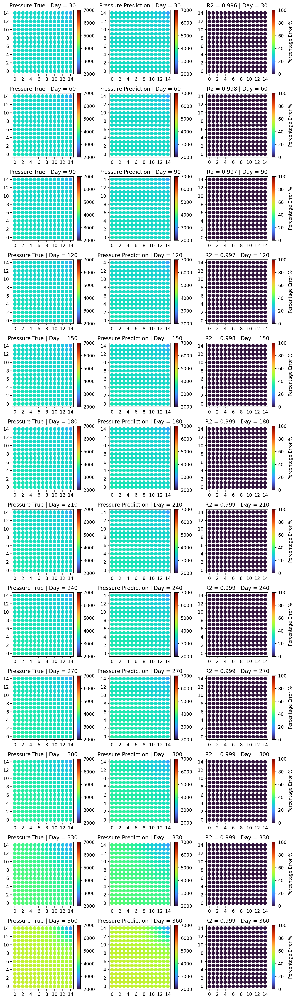

In [89]:
n=0
vmax = 7000
vmin = 2000
scale = 0.78
selected =[]
s = 50
plt.figure(figsize=(12*scale, 40*scale), dpi = 200)
for i in months1:
    for j in months2:
        if test_idx[i] < train_idx[j]:
            if not i in selected:
                selected.append(i)
                plt.subplot(12, 3, n+1)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= P_true[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Pressure True | Day = {}".format(test_idx[i]))

                plt.subplot(12, 3, n+2)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= P_pred[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Pressure Prediction | Day = {}".format(test_idx[i]))

                plt.subplot(12, 3, n+3)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((P_true[i] - P_pred[i])*100/P_true[i]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
                plt.colorbar(label = "Percentage Error %", )
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                r2 = R2(P_true[i].cpu().detach().numpy(), P_pred[i].cpu().detach().numpy())
                plt.title("R2 = {} | Day = {}".format(round(r2, 3), test_idx[i]))
                n+=3
                break
        
        else:
            if not j in selected:
                selected.append(j)
                plt.subplot(12, 3, n+1)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= P_true_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Pressure True | Day = {}".format(train_idx[j]))

                plt.subplot(12, 3, n+2)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= P_pred_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Pressure Prediction | Day = {}".format(train_idx[j]))

                plt.subplot(12, 3, n+3)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((P_true_train[j] - P_pred_train[j])*100/P_true_train[j]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
                plt.colorbar(label = "Percentage Error %")
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                r2 = R2(P_true_train[j].cpu().detach().numpy(), P_pred_train[j].cpu().detach().numpy())
                plt.title("R2 = {} | Day = {}".format(round(r2, 3), train_idx[j]))
                n+=3
if train_idx[months2][-1]>test_idx[months1][-1]:
    j = months2[-1]
    plt.subplot(12, 3, n+1)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= P_true_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Pressure True | Day = {}".format(train_idx[j]))

    plt.subplot(12, 3, n+2)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= P_pred_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Pressure Prediction | Day = {}".format(train_idx[j]))

    plt.subplot(12, 3, n+3)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((P_true_train[j] - P_pred_train[j])*100/P_true_train[j]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
    plt.colorbar(label = "Percentage Error %")
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    r2 = R2(P_true_train[j].cpu().detach().numpy(), P_pred_train[j].cpu().detach().numpy())
    plt.title("R2 = {} | Day = {}".format(round(r2, 3), train_idx[j]))
else:
    i = months1[-1]
    plt.subplot(12, 3, n+1)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= P_true[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Pressure True | Day = {}".format(test_idx[i]))

    plt.subplot(12, 3, n+2)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= P_pred[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Pressure Prediction | Day = {}".format(test_idx[i]))

    plt.subplot(12, 3, n+3)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((P_true[i] - P_pred[i])*100/P_true[i]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
    plt.colorbar(label = "Percentage Error %", )
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    r2 = R2(P_true[i].cpu().detach().numpy(), P_pred[i].cpu().detach().numpy())
    plt.title("R2 = {} | Day = {}".format(round(r2, 3), test_idx[i]))

plt.tight_layout()
plt.savefig(r"C:\Users\YUSIFOH\NNs\GNN\DATA DRIVEN\P_GAT.png")
plt.show()

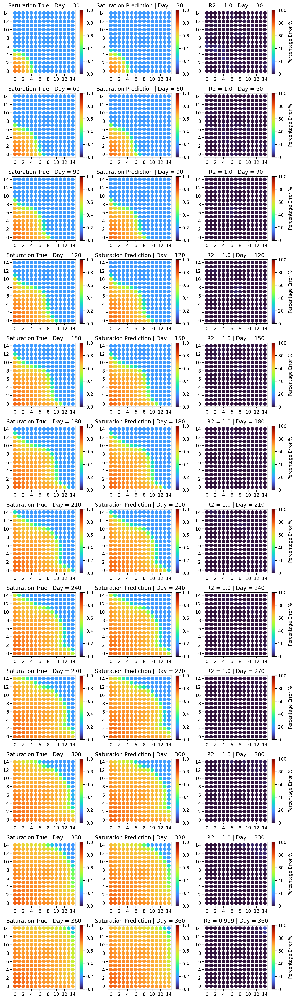

In [90]:
n=0
selected = []
scale = 0.78
s= 50
plt.figure(figsize=(12*scale, 40*scale), dpi = 200)
for i in months1:
    for j in months2:
        if test_idx[i] < train_idx[j]:
            if not i in selected:
                selected.append(i)
                plt.subplot(12, 3, n+1)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= S_true[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Saturation True | Day = {}".format(test_idx[i]))

                plt.subplot(12, 3, n+2)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= S_pred[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Saturation Prediction | Day = {}".format(test_idx[i]))

                plt.subplot(12, 3, n+3)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((S_true[i] - S_pred[i])*100/S_true[i]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
                plt.colorbar(label = "Percentage Error %", )
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                r2 = R2(S_true[i].cpu().detach().numpy(), S_pred[i].cpu().detach().numpy())
                plt.title("R2 = {} | Day = {}".format(round(r2, 3), test_idx[i]))
                n+=3
                break
        
        else:
            if not j in selected:
                selected.append(j)
                plt.subplot(12, 3, n+1)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= S_true_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Saturation True | Day = {}".format(train_idx[j]))

                plt.subplot(12, 3, n+2)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= S_pred_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
                plt.colorbar()
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.title("Saturation Prediction | Day = {}".format(train_idx[j]))

                plt.subplot(12, 3, n+3)
                plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((S_true_train[j] - S_pred_train[j])*100/S_true_train[j]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
                plt.colorbar(label = "Percentage Error %")
                plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
                plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
                r2 = R2(S_true_train[j].cpu().detach().numpy(), S_pred_train[j].cpu().detach().numpy())
                plt.title("R2 = {} | Day = {}".format(round(r2, 3), train_idx[j]))
                n+=3
if train_idx[months2][-1]>test_idx[months1][-1]:
    j = months2[-1]
    plt.subplot(12, 3, n+1)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= S_true_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Saturation True | Day = {}".format(train_idx[j]))

    plt.subplot(12, 3, n+2)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= S_pred_train[j].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Saturation Prediction | Day = {}".format(train_idx[j]))

    plt.subplot(12, 3, n+3)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((S_true_train[j] - S_pred_train[j])*100/S_true_train[j]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
    plt.colorbar(label = "Percentage Error %")
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    r2 = R2(S_true_train[j].cpu().detach().numpy(), S_pred_train[j].cpu().detach().numpy())
    plt.title("R2 = {} | Day = {}".format(round(r2, 3), train_idx[j]))
else:
    i = months1[-1]
    plt.subplot(12, 3, n+1)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= S_true[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Saturation True | Day = {}".format(test_idx[i]))

    plt.subplot(12, 3, n+2)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= S_pred[i].cpu().detach().numpy(), cmap="turbo", s= s, vmin=0.0, vmax=1.0)
    plt.colorbar()
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.title("Saturation Prediction | Day = {}".format(test_idx[i]))

    plt.subplot(12, 3, n+3)
    plt.scatter(cell_LocationsX, cell_LocationsY, c= abs((S_true[i] - S_pred[i])*100/S_true[i]).cpu().detach().numpy(), cmap="turbo", s= s, vmin = 0, vmax = 100)
    plt.colorbar(label = "Percentage Error %", )
    plt.xticks([0, 2, 4, 6, 8, 10, 12, 14])
    plt.yticks([0, 2, 4, 6, 8, 10, 12, 14])
    r2 = R2(S_true[i].cpu().detach().numpy(), S_pred[i].cpu().detach().numpy())
    plt.title("R2 = {} | Day = {}".format(round(r2, 3), test_idx[i]))

plt.tight_layout()
plt.savefig(r"C:\Users\YUSIFOH\NNs\GNN\DATA DRIVEN\S_GAT.png")
plt.show()